# Basic Image Enhancement Using Mathematical Operations

Image Processing techniques take advantage of mathematical operations to achieve different results. Most often we arrive at an enhanced version of the image using some basic operations. We will take a look at some of the fundamental operations often used in computer vision pipelines. In this notebook we will cover:

* Arithmetic Operations like addition, multiplication
* Thresholding & Masking
* Bitwise Operations like OR, AND, XOR

## Import the libraries

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Image

#this inline specification is to display directly images in the notebook
%matplotlib inline 

## Original Image

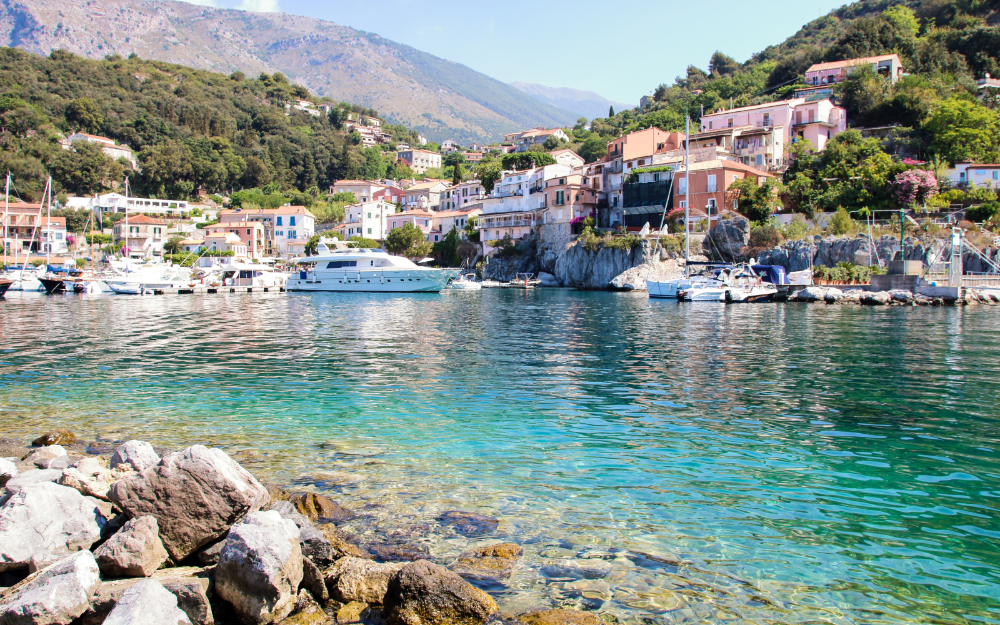

In [32]:
# Read Image
img_bgr = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/maratea_coast.jpg", cv2.IMREAD_COLOR)
# Change image color space from BGR to RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display 18x18 pixel image.
Image(filename="datos/BasicImageEnhancementUsingMathematicalOperations/maratea_coast.jpg")

## Addition or Brightness

In this operation, we initialize a matrix with the same shape as the image, filled with a constant value (in this case, 50). When we add this matrix to the image, all pixel values increase by 50. Since higher pixel values correspond to brighter colors, the image will appear closer to white and look significantly brighter. Conversely, when we subtract the matrix from the image, all pixel values decrease by 50, making the image appear darker as the colors move closer to black.

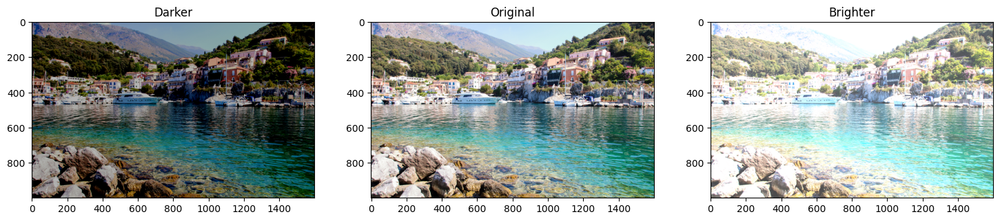

In [33]:
# Create a matrix filled with 75, matching image dimensions
matrix = np.ones(img_rgb.shape, dtype="uint8") * 75

# Increase brightness by adding 75 to each pixel value
img_rgb_brighter = cv2.add(img_rgb, matrix)
# Decrease brightness by subtracting 75 from each pixel value
img_rgb_darker   = cv2.subtract(img_rgb, matrix)

# Show the images
plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);   plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);          plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter); plt.title("Brighter");

## Multiplication or Contrast

Just like addition can result in brightness change, multiplication can be used to improve the contrast of the image.

Contrast is the difference in the intensity values of the pixels of an image. Multiplying the intensity values with a constant can make the difference larger or smaller ( if multiplying factor is < 1 ).

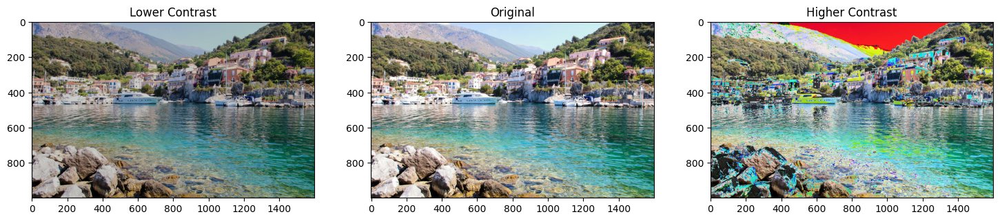

In [34]:
# Create a matrix filled with 0.8, matching the image dimensions
matrix1 = np.ones(img_rgb.shape) * 0.8
# Create a matrix filled with 1.2, matching the image dimensions
matrix2 = np.ones(img_rgb.shape) * 1.2

# Scale image pixel values by 0.8 to reduce brightness and contrast
img_rgb_darker   = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
# Scale image pixel values by 1.2 to increase brightness and contrast
img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb), matrix2))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher Contrast");

### Why did the sky turn red in the "Higher Contrast Image"? 

The issue is caused by numeric overflow. The color of the sky is already close to white, which means its pixel values are near the maximum limit of 255 (for 8-bit images). When we scale these values by multiplying them with a factor greater than 1 (e.g., 1.2), some pixel values exceed 255. However, since the image is stored as np.uint8 (8-bit unsigned integer), values above 255 "wrap around" due to overflow, resulting in unexpected colors like red.

### Solution: Handling Overflow using np.clip

The np.clip function ensures that a value remains within a specified interval. If the value falls outside this range, the function returns the closest boundary of the interval.

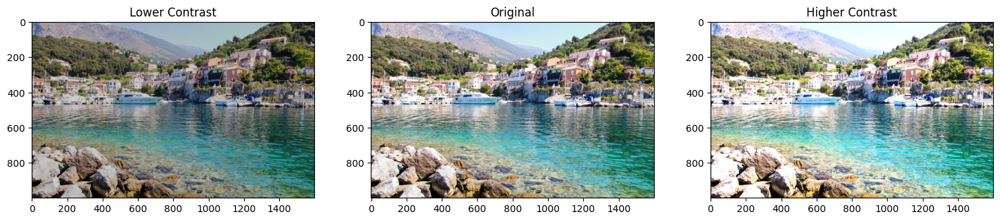

In [35]:
# Create a matrix filled with 0.8, matching the image dimensions
matrix1 = np.ones(img_rgb.shape) * 0.8
# Create a matrix filled with 1.2, matching the image dimensions
matrix2 = np.ones(img_rgb.shape) * 1.2

# Scale image pixel values by 0.8 to reduce brightness and contrast
img_rgb_lower  = np.uint8(cv2.multiply(np.float64(img_rgb), matrix1))
# Scale image pixel values by 1.2 to increase brightness and contrast using np.clip to avoid overflow
img_rgb_higher = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb), matrix2), 0, 255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_lower); plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);       plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_higher);plt.title("Higher Contrast");

## Image Thresholding
Binary Images have a lot of use cases in Image Processing. One of the most common use cases is that of creating masks. Image Masks allow us to process on specific parts of an image keeping the other parts intact. Image Thresholding is used to create Binary Images from grayscale images. You can use different thresholds to create different binary images from the same original image.

**Function Syntax**

``` python
retval, dst = cv2.threshold( src, thresh, maxval, type[, dst] )
```

`dst`: The output array of the same size and type and the same number of channels as `src`.

The function has **4 required arguments**:

1. `src`: input array (multiple-channel, 8-bit or 32-bit floating point).

2. `thresh`: threshold value.

3. `maxval`: maximum value to use with the THRESH_BINARY and THRESH_BINARY_INV thresholding types.

4. `type`: thresholding type (see ThresholdTypes).


**Function Syntax of adaptive threshold**

``` python
dst = cv.adaptiveThreshold( src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst] )
```

`dst`	Destination image of the same size and the same type as src.

The function has **6 required arguments**:
1. `src`:	Source 8-bit single-channel image.

2. `maxValue`:	Non-zero value assigned to the pixels for which the condition is satisfied

3. `adaptiveMethod`:	Adaptive thresholding algorithm to use, see AdaptiveThresholdTypes. The BORDER_REPLICATE | BORDER_ISOLATED is used to process boundaries.

4. `thresholdType:`	Thresholding type that must be either THRESH_BINARY or THRESH_BINARY_INV, see ThresholdTypes.

5. `blockSize`:	Size of a pixel neighborhood that is used to calculate a threshold value for the pixel: 3, 5, 7, and so on.

6. `C`:	Constant subtracted from the mean or weighted mean (see the details below). Normally, it is positive but may be zero or negative as well.

### OpenCV Documentation

<a href="https://docs.opencv.org/4.5.1/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57
https://docs.opencv.org/4.5.1/d7/d4d/tutorial_py_thresholding.html" target="_blank">Documentation link</a>

(768, 1024)


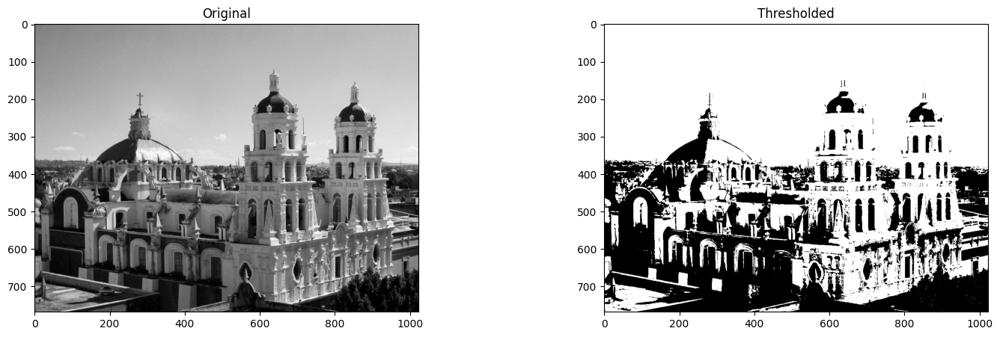

In [36]:
img_read = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/puebla_architecture.jpg", cv2.IMREAD_GRAYSCALE)
# Apply a threshold to the image
retval, img_thresh = cv2.threshold(img_read, 100, 255, cv2.THRESH_BINARY)

# Show the images
plt.figure(figsize=[18, 5])

plt.subplot(121);plt.imshow(img_read, cmap="gray");  plt.title("Original")
plt.subplot(122);plt.imshow(img_thresh, cmap="gray");plt.title("Thresholded")

print(img_thresh.shape)

### Application: Sheet Music Reader
Suppose you wanted to build an application that could read (decode) sheet music. This is similar to
Optical Character Recognigition (OCR) for text documents where the goal is to recognize text characters. In either application, one of the first steps in the processing pipeline is to isolate the important information in the image of a document (separating it from the background). This task can be accomplished with thresholding
techniques. Let's take a look at an example.

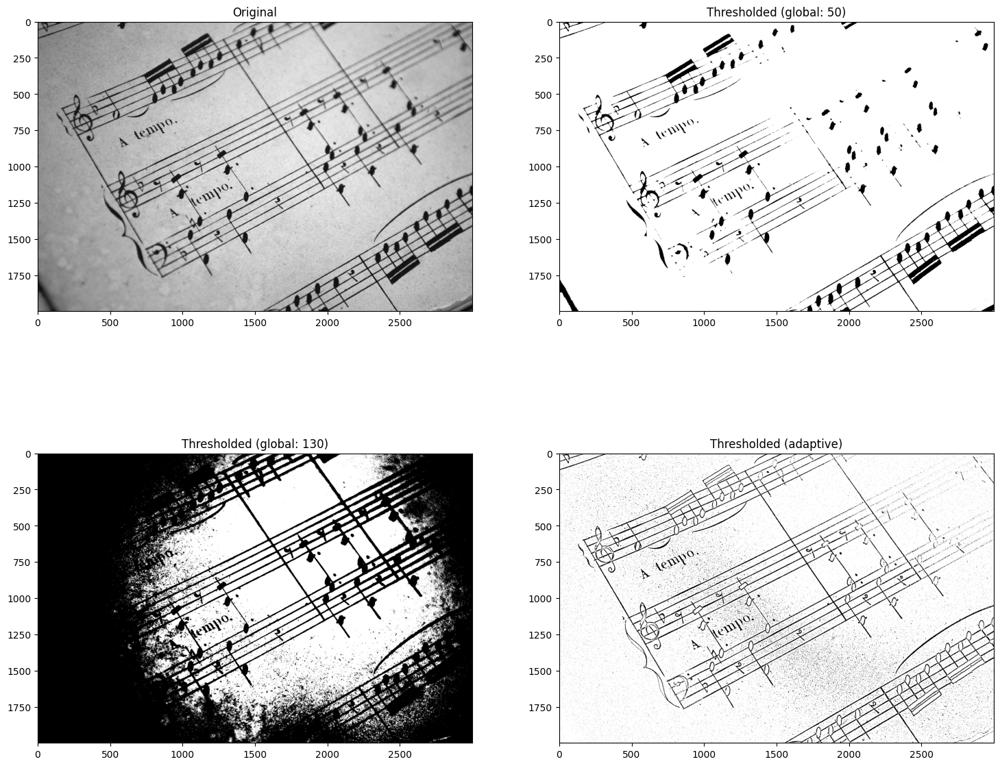

In [37]:
# Read the original image
img_read = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/sheet_music.jpg", cv2.IMREAD_GRAYSCALE)

# Perform global thresholding with 50 and 255 as the threshold values
retval, img_thresh_gbl_1 = cv2.threshold(img_read, 50, 255, cv2.THRESH_BINARY)

# Perform global thresholding with 130 and 255 as the threshold values
retval, img_thresh_gbl_2 = cv2.threshold(img_read, 130, 255, cv2.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

### Application: Autonomous Driving - Lane Detection

Suppose you wanted to build an application that helps autonomous vehicles detect lane markings on the road. This is a critical task for self-driving cars, as detecting and following lane boundaries ensures safe navigation. One of the first steps in this process is to isolate the lane markings from the rest of the image (e.g., separating them from the road surface, shadows, or other objects). This can be effectively achieved using thresholding techniques .

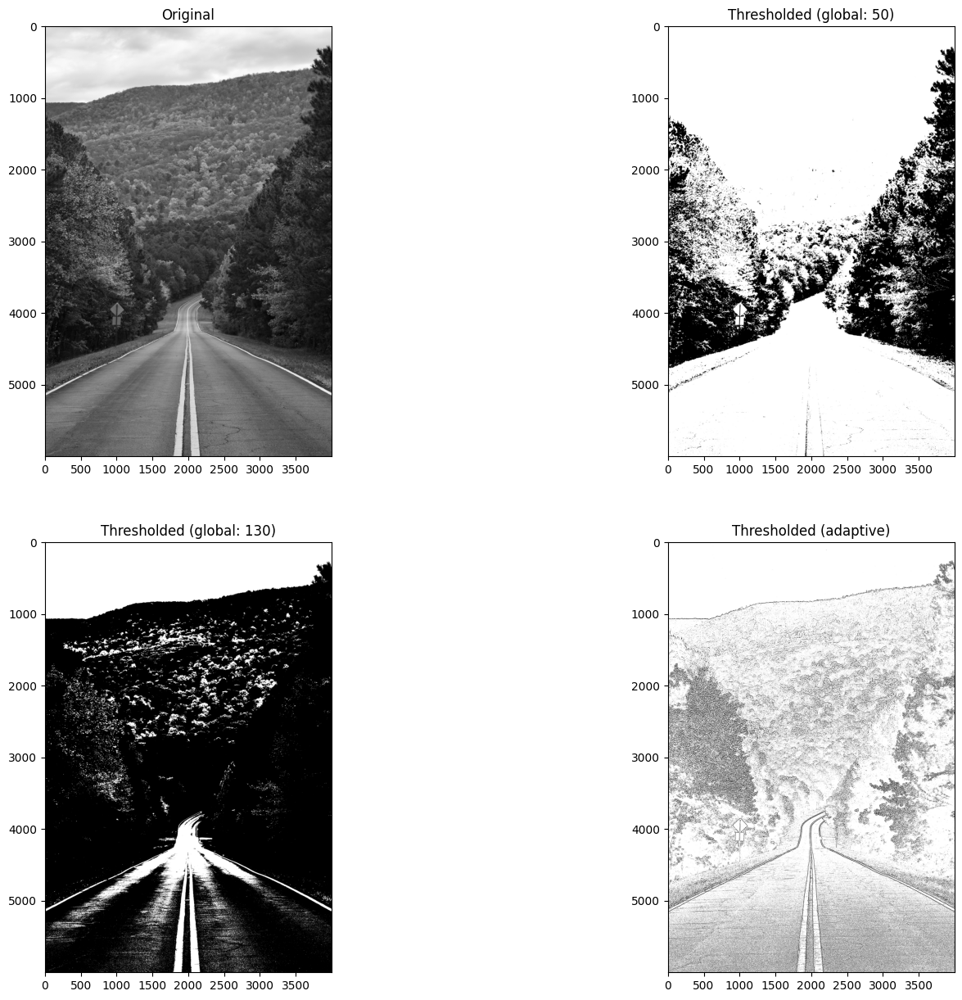

In [38]:
# Read the original image
img_read = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/road_image.jpg", cv2.IMREAD_GRAYSCALE)

# Perform global thresholding
retval, img_thresh_gbl_1 = cv2.threshold(img_read, 50, 255, cv2.THRESH_BINARY)

# Perform global thresholding
retval, img_thresh_gbl_2 = cv2.threshold(img_read, 130, 255, cv2.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

## Bitwise Operations

**Function Syntax**

Example API for `cv2.bitwise_and()`. Others include: `cv2.bitwise_or()`, `cv2.bitwise_xor()`, `cv2.bitwise_not()`

``` python
dst = cv2.bitwise_and( src1, src2[, dst[, mask]] )
```

`dst`: Output array that has the same size and type as the input arrays.

The function has **2 required arguments**:

1. `src1`:	first input array or a scalar.

2. `src2`:	second input array or a scalar.

An important optional argument is:

1. `mask`:	optional operation mask, 8-bit single channel array, that specifies elements of the output array to be changed.

### OpenCV Documentation

1. <a href="https://docs.opencv.org/4.5.1/d0/d86/tutorial_py_image_arithmetics.html" target="_blank">Arithmetic Operations on Images</a>

2. <a href="https://docs.opencv.org/4.5.0/d2/de8/group__core__array.html#ga60b4d04b251ba5eb1392c34425497e14" target="_blank">bitwise_and(...) function</a>

(225, 225)


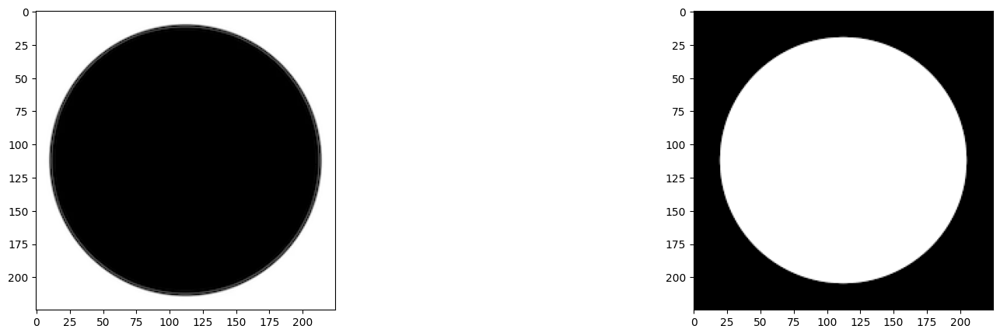

In [39]:
# Open image with black circle
img_black_cir = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/black_circle.png", cv2.IMREAD_GRAYSCALE)
# Open image with white circle
img_white_cir = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/white_circle.png", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=[20, 5])
plt.subplot(121);plt.imshow(img_black_cir, cmap="gray")
plt.subplot(122);plt.imshow(img_white_cir, cmap="gray")
print(img_white_cir.shape)

## Bitwise AND Operation

The AND gate has the following behavior

In [40]:
print(0 & 0)
print(0 & 1)
print(1 & 0)
print(1 & 1)

0
0
0
1


In the case of the images, we can observe that they are opposites. Since the white pixels are represented by 1s and the black pixels by 0s, the result of their combination will be entirely 0s.

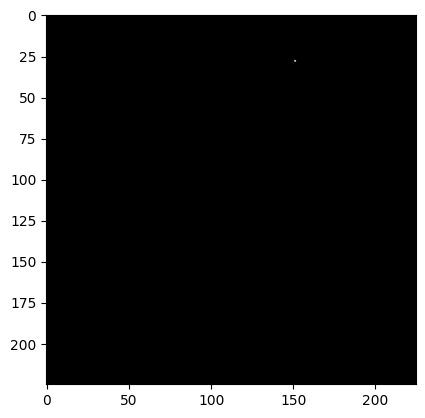

In [41]:
result = cv2.bitwise_and(img_black_cir, img_white_cir, mask=None)
plt.imshow(result, cmap="gray")

### Bitwise OR Operation

The OR operation has the following behaviour:

In [42]:
print(0 | 0)
print(0 | 1)
print(1 | 0)
print(1 | 1)

0
1
1
1


In the case of the images, we can observe that only the areas which are black (0) in both images appear as black (0) in the resulting image.

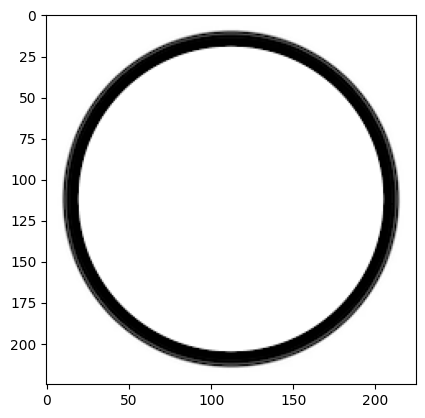

In [43]:
result = cv2.bitwise_or(img_black_cir, img_white_cir, mask=None)
plt.imshow(result, cmap="gray")

## Bitwise NOT Operation

The OR operation has the following behaviour:

In [44]:
print(int(not 0))
print(int(not 1))

1
0


In [45]:
print(0 ^ 0)
print(0 ^ 1)
print(1 ^ 0)
print(1 ^ 1)

0
1
1
0


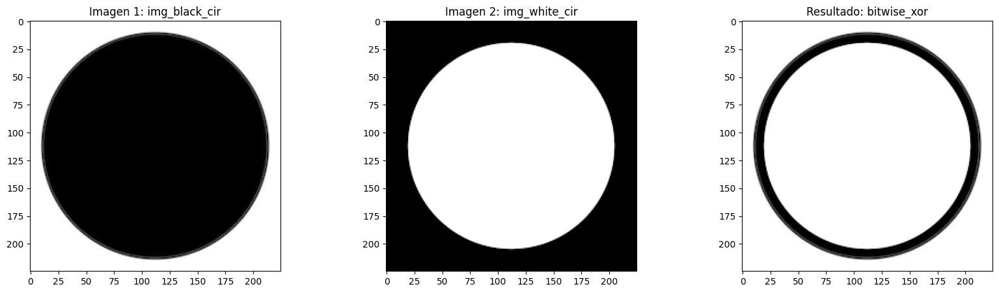

In [46]:
result = cv2.bitwise_xor(img_black_cir, img_white_cir, mask=None)

plt.figure(figsize=[20, 5])

plt.subplot(131) 
plt.imshow(img_black_cir, cmap="gray")
plt.title("Imagen 1: img_black_cir")
plt.subplot(132)
plt.imshow(img_white_cir, cmap="gray")
plt.title("Imagen 2: img_white_cir")
plt.subplot(133)
plt.imshow(result, cmap="gray")
plt.title("Resultado: bitwise_xor")

plt.show()

Note: Since the circles in this case have different sizes, the entire image does not appear white. This is because there are overlapping regions in both images where the XOR operation results in 0 (0 XOR 0 = 0)

## Application: Logo Manipulation

In this section we will show you how to fill in the white lettering of the UDLAP logo below with a background image.

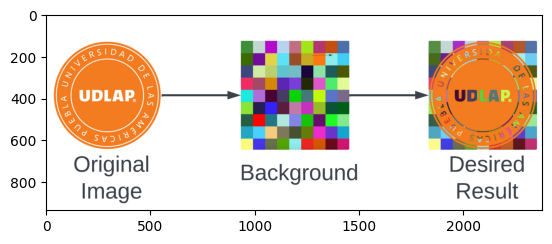

In [47]:
desired = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/desired_result.png", cv2.IMREAD_COLOR_RGB)
plt.imshow(desired)

### Read Foreground Image

(1800, 1800, 3)


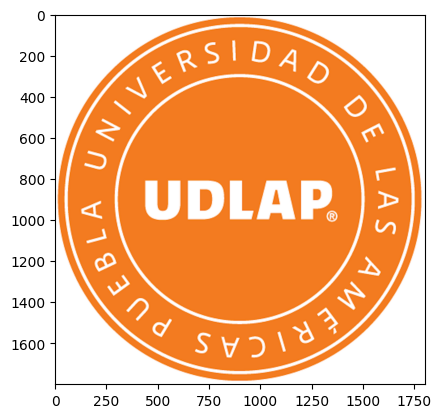

In [48]:
img_bgr = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/udlap_logo.png")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

print(img_rgb.shape)

logo_h = img_rgb.shape[0]
logo_w = img_rgb.shape[1]

### Read Background Image

(1800, 1800, 3)


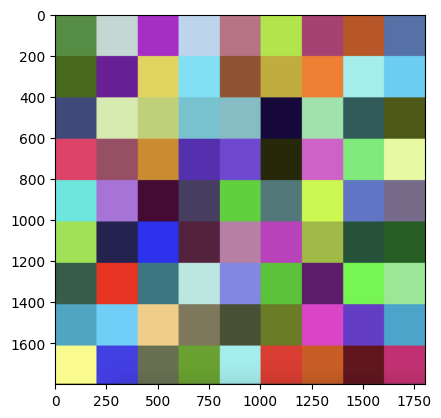

In [49]:
# Read in image of color cheackerboad background
img_background_bgr = cv2.imread("datos/BasicImageEnhancementUsingMathematicalOperations/checkerboard_color.png")
img_background_rgb = cv2.cvtColor(img_background_bgr, cv2.COLOR_BGR2RGB)

# Resize background image to same size as logo image
img_background_rgb = cv2.resize(img_background_rgb, (logo_w, logo_h), interpolation=cv2.INTER_AREA)

plt.imshow(img_background_rgb)
print(img_background_rgb.shape)

### Create Mask for Original Image Using Binary Tresholding

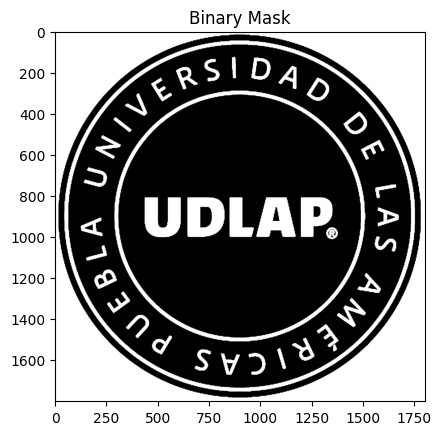

In [50]:
# Convert image to grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to create a mask
retval, img_mask = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)

# Show binary mask
plt.imshow(img_mask, cmap="gray")
plt.title("Binary Mask")

plt.show()

### Invert the Mask Applying Bitwise NOT Operation

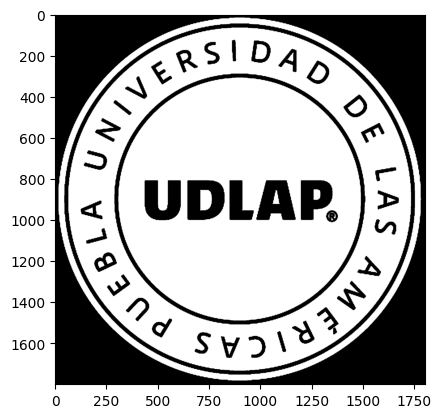

In [51]:
# Create an inverse mask
img_mask_inv = cv2.bitwise_not(img_mask)
plt.imshow(img_mask_inv, cmap="gray")

### Apply background on the Mask using Bitwise Operation AND

The background values will only appear in regions where the mask has a value of 1 (white). For example, if a pixel in the background has the color value 0x10010001, applying the AND operation with the mask value 0x11111111 will preserve the original color, as the result of the operation remains unchanged

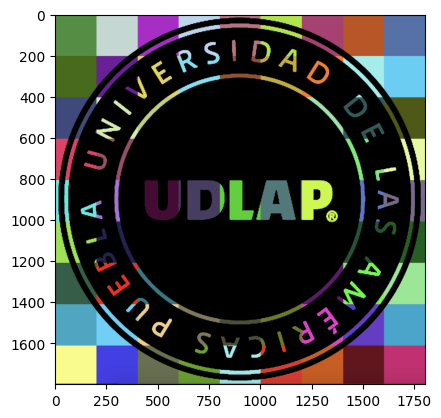

In [52]:
# Create colorful background "behind" the logo lettering
img_background = cv2.bitwise_and(img_background_rgb, img_background_rgb, mask=img_mask)
plt.imshow(img_background)

### Isolate foreground from image using the inverse mask

In this case, we isolate the foreground by applying the inverse mask, where the background is suppressed and only the regions corresponding to the mask's one values (white) remain visible.

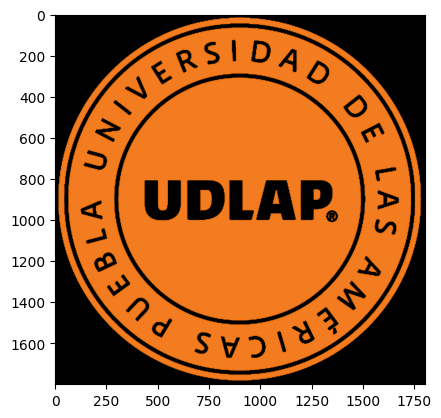

In [53]:
# Isolate foreground (red from original image) using the inverse mask
img_foreground = cv2.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground)

### Result: Merge Foreground and Background


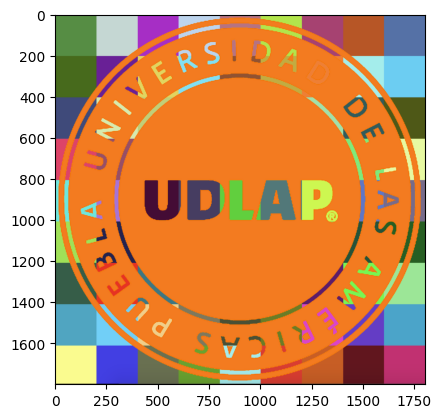

In [54]:
# Add the image foreground and background together
# to create the final image
result = cv2.add(img_background, img_foreground)
plt.imshow(result)

### Save Image

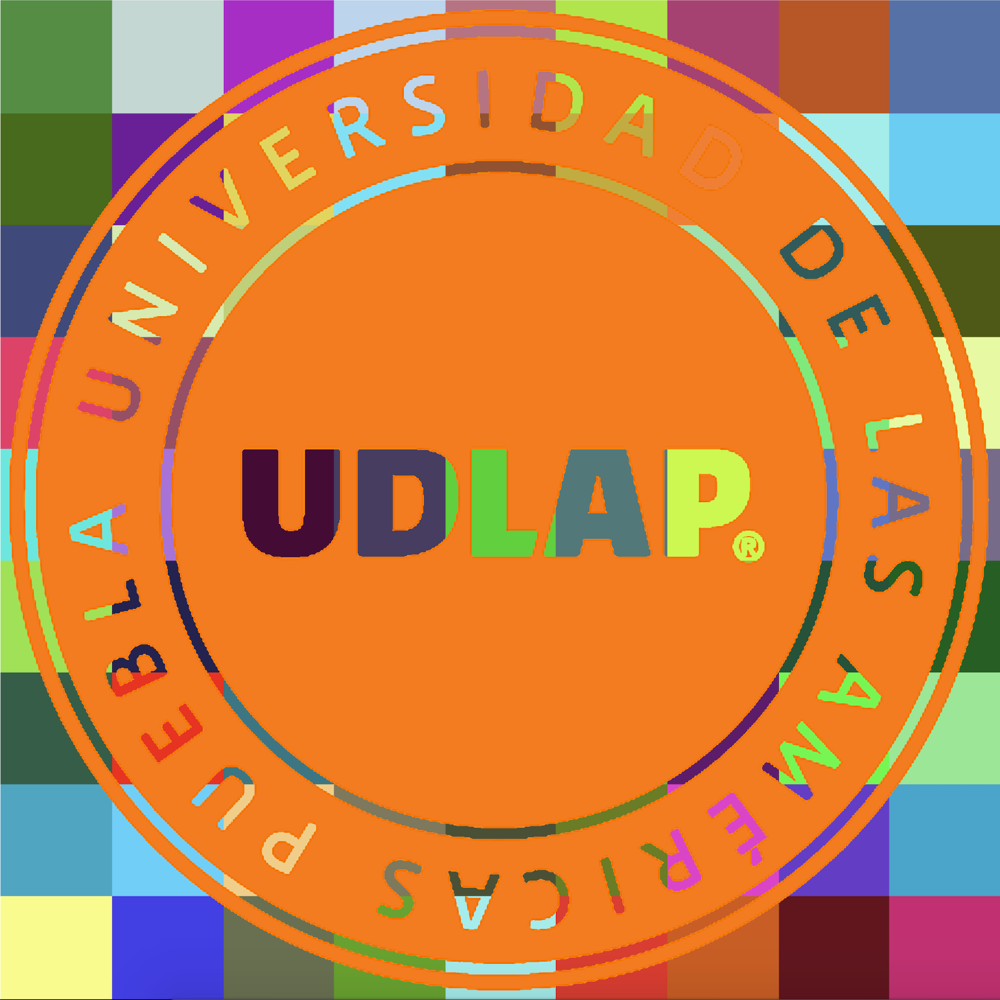

In [55]:
# Save result image
cv2.imwrite("datos/BasicImageEnhancementUsingMathematicalOperations/Saved/logo_final.png", result[:, :, ::-1])
# Display the final image
Image(filename="datos/BasicImageEnhancementUsingMathematicalOperations/Saved/logo_final.png")